In [3]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd

In [9]:
import seaborn as sns

In [43]:
def x():
  return -3 + np.zeros(100000)

def y():
  return 5 + np.random.randn(100000)

def z(x, y):
  return x + y + np.random.randn(100000) 

def sample():
  x_ = x()
  y_ = y()
  z_ = z(x_, y_)
  return x_, y_, z_

In [44]:
x_, y_, z_ = sample()

In [45]:
x_, y_, z_

(array([-3., -3., -3., ..., -3., -3., -3.]),
 array([3.67205326, 5.03389078, 5.0184888 , ..., 3.5092794 , 4.61188231,
        4.57776525]),
 array([ 0.8112757 , -0.0360463 ,  4.22239584, ...,  0.62106749,
         0.67616478,  2.57797323]))

In [36]:
x_adj = []
y_adj = []
z_adj = []
for i in range(len(z_)):
    if z_[i] > 2.5 :
        x_adj.append(x_[i])
        y_adj.append(y_[i])
        z_adj.append(z_[i])

(array([6.0000e+00, 2.9000e+01, 1.1800e+02, 4.4200e+02, 1.3160e+03,
        3.1850e+03, 6.4660e+03, 1.0802e+04, 1.4992e+04, 1.7219e+04,
        1.6332e+04, 1.2720e+04, 8.5130e+03, 4.6240e+03, 2.1330e+03,
        7.9200e+02, 2.3000e+02, 6.4000e+01, 1.5000e+01, 2.0000e+00]),
 array([-4.01564386, -3.39770847, -2.77977308, -2.16183769, -1.5439023 ,
        -0.92596691, -0.30803152,  0.30990387,  0.92783926,  1.54577465,
         2.16371004,  2.78164542,  3.39958081,  4.0175162 ,  4.63545159,
         5.25338698,  5.87132237,  6.48925776,  7.10719315,  7.72512854,
         8.34306393]),
 <a list of 20 Patch objects>)

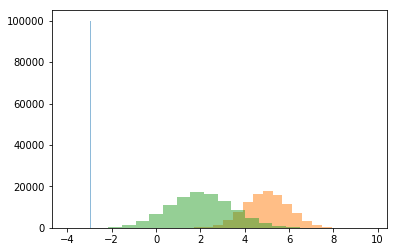

In [47]:
plt.hist(x_, alpha = 0.5, bins = 20)
plt.hist(y_, alpha = 0.5, bins = 20)
plt.hist(z_, alpha = 0.5, bins = 20)

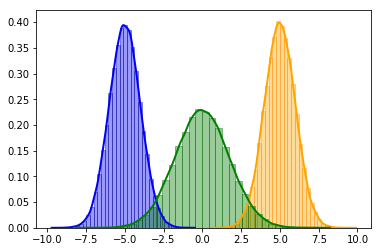

In [19]:
sns.distplot(x_, hist = True, kde = True,bins=int(180/5), color = 'blue', 
             hist_kws={'edgecolor':'darkblue'},
             kde_kws={'linewidth': 2})
sns.distplot(y_, hist = True, kde = True,bins=int(180/5), color = 'orange',
             hist_kws={'edgecolor':'darkorange'},
             kde_kws={'linewidth': 2})
sns.distplot(z_, hist = True, kde = True,bins=int(180/5), color = 'green', 
             hist_kws={'edgecolor':'darkgreen'},
             kde_kws={'linewidth': 2})                     

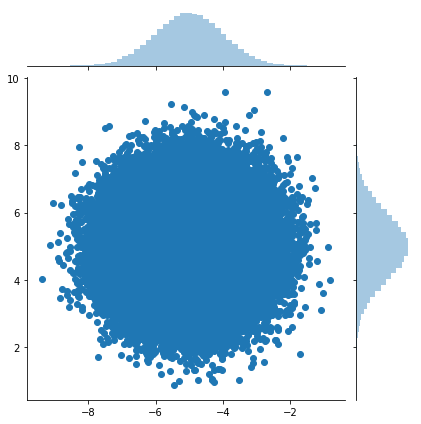

In [20]:
sns.jointplot(x = x_, y = y_)

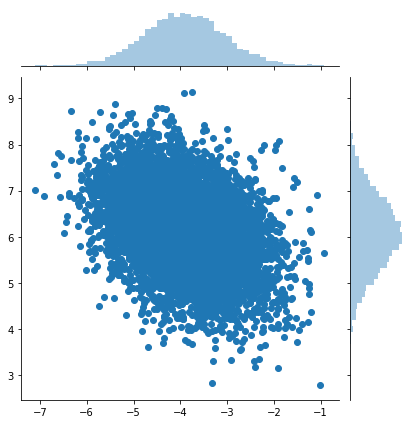

In [38]:
sns.jointplot(x = x_adj, y = y_adj)

Invariant Causal Prediction

Confidence intervals for causal effects, using data collected in different experimental or environmental conditions. Hidden variables can be included in the model with a more experimental version.

Source R package: https://cran.r-project.org/web/packages/InvariantCausalPrediction/index.html

I re-write this Python package for those who are working with Python 

What are included in this package: 
- hiddenICP
- ICP
- plot.InvariantCausalPrediction
- summary.InvariantCausalPrediction 


In [15]:
    
    #UNUSAGE
    #X A matrix (or data frame) with the predictor variables for all experimental settings

    #Y The response or target variable of interest. Can be numeric for regression or a factor with two levels for binary classification.

    # ExpInd Indicator of the experiment or the intervention type an observation belongs to.
    #Can be a numeric vector of the same length as Y with K unique entries if there
    #are K different experiments (for example entry 1 for all observational data and
    #entry 2 for intervention data). Can also be a list, where each element of the
    #list contains the indices of all observations that belong to the corresponding
    #grouping in the data (for example two elements: first element is a vector that
    #contains indices of observations that are observational data and second element
    #is a vector that contains indices of all observations that are of interventional
    #type).

    # alpha The level of the test procedure. Use the default alpha=0.1 to obtain 90% confidence intervals.

    # mode Currently only mode "asymptotic" is implemented; the argument is thus in the current version without effect.

    # intercept Boolean variable; if TRUE, an intercept is added to the design matrix (but coefficients are returned without intercept term).
def hiddenICP( X, Y, ExpInd , alpha=0.1, mode = "asymptotic" ,intercept = False):
    if isinstance(X) and X.isnumeric():
         X = np.asmatrix(X,ncol=1)
    if not isinstance(X, matrix) and not isinstance(X, pd.DataFrame):
         print("'X' must be a matrix or data frame")
         return
    if not isinstance(Y):
         print("'Y' must be a vector")
         return
    if X.shape[0] <= X.shape[1]:
         print(paste( "hiddenICP not suitable for high-dimensional data (at the moment) \n -- need nrow(X)>ncol(X) but have nrow(X)=",nrow(X)," and ncol(X)=",ncol(X)))
         return

    
    if not isinstance(ExpInd, list):
        if len(ExpInd) != len(Y):
             stop("if `ExpInd' is a vector, it needs to have the same length as `Y'")
        uni = unique(ExpInd)
        if len(uni)==1 :
             stop(paste("there is just one environment ('ExpInd'=",uni[1]," for all observations) and the method needs at least two distinct environments",sep=""))
        if min(table(ExpInd))<=2:
            cat("\n out put of 'table(ExpInd)':\n ")
            print(table(ExpInd))
            stop("one environment has just one or two observations (as supllied by 'ExpInd'); there need to be at least 3 (and ideally dozens) of observations in each environment; the out put of 'table(ExpInd)' is given below to show the number of observations in each unique environment as supplied by 'ExpInd'")
        
        
        K = len(uni)
        ExpIndNEW = list()
        for uc in range(1, K):
            ExpIndNEW[[uc]] = which(ExpInd==uni[uc])
            ExpIndNEW[[uc]]["value"] = uni[uc]
        
        ExpInd = ExpIndNEW
        rm(ExpIndNEW)
    else:
        ran = range(unlist(ExpInd))
        if ran[1]<1:
             stop(paste("if `ExpInd' is a list with indicies of observations, \n minimal entry has to be at least 1 but is",ran[1]))
        if ran[2]>length(Y):
             stop(paste("if `ExpInd' is a list with indicies of observations, \n maximal entry has to be at most equal \n to the length",length(Y),"of the observations but is",ran[2]))
    
    X = np.asmatrix(X)
    if len(ucol = unique(colnames(X))) < min(3, ncol(X)):
      print("haha")
         #colnames(X) = paste("Variable",1:ncol(X),sep="_")
    colX = colnames(X)

    
    if intercept :
        X = pd.concat(rep(1,nrow(X)),X)

    K = len(ExpInd)
    p = X.shape[1]
    n = X.shape[0]

    kc = 1
    if K>2 :
      KC = K
    else :
      KC = 1
    ConfInt = np.asmatrix(NA, nrow=2,ncol=p)
    pvalues = rep(1,p)
    for kc in range(1, KC) :
        ins = ExpInd[[kc]]
        out = (1,n)[-ins]
        DS = (t(X[ins,]) * X[ins,])/len(ins) - (t(X[out,]) * X[out,])/len(out)
        Drho = (t(X[ins,]) * Y[ins])/len(ins) - (t(X[out,]) * Y[out])/len(out)
        DSI = solve(DS)
    
        
        betahat = asnumeric(solve( DS,Drho))
        if kc==1 :
             betahatall = betahat 
        else :
             betahatall = betahatall+betahat
        Zin = np.asmatrix(nrow=length(ins),ncol=p)
        Zout = np.asmatrix(nrow=length(out),ncol=p)
        for i in range(1,len(ins)):
            tmp = DSI * X[ins[i],]
            Zin[i,] = asnumeric(- tmp * sum(tmp*Drho) + Y[ins[i]] *tmp)
        
        for i in range(1,len(out)):
            tmp = DSI * X[out[i],]
            Zout[i,] = asnumeric(- tmp * sum(tmp*Drho) + Y[out[i]] *tmp)
        
        sigmavec = sqrt(diag((cov(Zin)/length(ins)+cov(Zout)/length(out))))

        pvalues = pmin(pvalues, 2*K* (1-pt( abs(betahat)/pmax(10^(-10),sigmavec),df=n-1)))
        
        addvar = qnorm(max(0.5,1-alpha/(2*K))) * sigmavec
        maximineffectsN = sign(betahat) * pmax( 0, abs(betahat) - addvar)
        ConfInt[1,] = pmax(ConfInt[1,], betahat - addvar, True) 
        ConfInt[2,] = pmin(ConfInt[2,], betahat + addvar, True) 
        if kc == 1:
            maximineffects = maximineffectsN
        else:
            for varc in range(1,p):
                if abs(maximineffectsN[varc]) > abs(maximineffects[varc]):
                    maximineffects[varc] = maximineffectsN[varc]
            
        
    
    betahat = betahatall/KC
    maximinCoefficients = maximineffects
    if intercept:
        betahat = betahat[-1]
        maximinCoefficients = maximinCoefficients[-1]
        ConfInt = ConfInt[:-1]
        pvalues = pvalues[-1]
    
    ConfInt = apply(ConfInt,2,sort,decreasing=TRUE)
    retobj = list(betahat=betahat, maximinCoefficients=maximinCoefficients, ConfInt=ConfInt, pvalues=pvalues, colnames=colX, alpha=alpha)

    return retobj 










IndentationError: expected an indented block (<ipython-input-15-c92f92b6c80d>, line 21)